# Spatial Data Analysis, Visualisation and Forecasting of COVID-19

*NB: This jupter notebook takes about 12 minutes to run.*

*The following libraries are required.*

In [19]:
import os
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
from datetime import datetime
import json
import warnings
import country_converter as coco # convert country names to ios3 code
import world_bank_data as wb # get population of different countries
import us # get the states in the us
import umap
import hdbscan
from sklearn.metrics import mean_squared_error, silhouette_score
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from scipy.optimize import curve_fit


pd.set_option('display.max_rows', 50)
%matplotlib inline
init_notebook_mode()
warnings.filterwarnings('ignore')

# default colour palette
colours = ['rgb(31, 119, 180)', 'rgb(255, 127, 14)',
           'rgb(44, 160, 44)', 'rgb(214, 39, 40)',
           'rgb(148, 103, 189)', 'rgb(140, 86, 75)',
           'rgb(227, 119, 194)', 'rgb(127, 127, 127)',
           'rgb(188, 189, 34)', 'rgb(23, 190, 207)']

## 1. Introduction

COVID-19 is a novel infectious disease caused by SARS-Cov-2, which was first identified in Wuhan, China, and has since spread across the world, resulting in the ongoing globsl pandemic. In the earlt stage, the epidemic was mostly contained within China. Heretofore, the US and Europe have become the epicentre instead.

Since the outbreak, researchers and scientists worldwide have put much effort into studying the epidemic, including data visualisation and forecasting of the epidemic trend. Johns Hopkins University (JHU) has developed an interactive dashboard displaying COVID-19 cases across the world, more details at https://coronavirus.jhu.edu/map.html. Yang et al. (2020) integrated population migration data before and after 23th January 2020 and most updated COVID-19 data into the Susceptible-Exposed-Infectious-Removed (SEIR) model to derive the epidemic curve, and then used Long-short-term-memory (LSTM) model, trained on 2013 SARS data, to predict the epidemic.

There are briefly three parts of this notebook: exploratory data analysis, clustering analysis and short-term forecasting.

## 2. Data Import and Preprocessing

The dataset used in this report is downloaded from Kaggle, available from https://www.kaggle.com/sudalairajkumar/novel-corona-virus-2019-dataset, Version 81, as of 1st May 2020. However, the original data source is provided by JHU (https://github.com/CSSEGISandData/COVID-19). The latest update date of the dataset is 1st May 2020. 

*covid_19_data* contains daily level information on the cumulative numbers of affected cases, deaths and recovery from COVID-19 for countries/regions across the world. *time_series_covid_19_confirmed* gives time series summary tables of confirmed cases in a different format with dates being the columns and location information, i.e. longitude and latitude, which we will use for map visualisation.

First of all, we need to do some data cleaning.

In [20]:
df_raw = pd.read_csv(os.path.join('novel-corona-virus-2019-dataset', 'covid_19_data.csv'))

In [21]:
# the dataset for confirmed cases which contains information for longitude and latitude
df_confirm_ts = pd.read_csv(os.path.join('novel-corona-virus-2019-dataset', 'time_series_covid_19_confirmed.csv'))

In [22]:
# take a look at the original dataset
df_raw.sample(5)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
9520,9521,03/28/2020,NaN,Malaysia,3/8/20 5:31,2320.0,27.0,320.0
1858,1859,02/19/2020,NaN,Sweden,2020-02-01T02:13:26,1.0,0.0,0.0
18531,18532,04/25/2020,Diamond Princess cruise ship,US,2020-04-26 02:31:18,49.0,0.0,0.0
17104,17105,04/21/2020,NaN,Fiji,2020-04-21 23:39:09,18.0,0.0,3.0
17605,17606,04/22/2020,Jiangxi,Mainland China,2020-04-22 23:38:57,937.0,1.0,936.0


In [23]:
df = df_raw.drop(columns=['SNo', 'Last Update'], axis=1)
df.rename(
    columns={'ObservationDate': 'Date', 'Province/State': 'State', 'Country/Region': 'Country'}, 
    inplace=True
)

In [24]:
# group the dataset by country
df_ctrs = df.groupby(['Country', 'Date']).sum().reset_index()

Now, we append daily increased cases to the dataframe. Since there are some numbers below zero, which may be caused by misorganisation or subsequent corrections of data, negetive values are set to 0 manually.

In [25]:
# count daily increases by countries
df_inc = df_ctrs.groupby(['Country'])[['Confirmed', 'Deaths', 'Recovered']].diff().fillna(0) \
            .rename(columns={'Confirmed': 'ConfirmInc', 'Deaths': 'DeathInc', 'Recovered': 'RecoverInc'})

In [26]:
df_ctrs = pd.concat([df_ctrs, df_inc], axis=1).reset_index(drop=True)

In [27]:
num = df_ctrs._get_numeric_data()
num[num<0] = 0

In [28]:
df_ctrs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11292 entries, 0 to 11291
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Country     11292 non-null  object 
 1   Date        11292 non-null  object 
 2   Confirmed   11292 non-null  float64
 3   Deaths      11292 non-null  float64
 4   Recovered   11292 non-null  float64
 5   ConfirmInc  11292 non-null  float64
 6   DeathInc    11292 non-null  float64
 7   RecoverInc  11292 non-null  float64
dtypes: float64(6), object(2)
memory usage: 705.9+ KB


In [29]:
# take a look at the modified dataset
df_ctrs.sample(5)

,Country,Date,Confirmed,Deaths,Recovered,ConfirmInc,DeathInc,RecoverInc
6514,Malta,03/14/2020,18.0,0.0,1.0,6.0,0.0,0.0
3225,Ethiopia,04/13/2020,74.0,3.0,14.0,3.0,0.0,4.0
3817,Greece,03/01/2020,7.0,0.0,0.0,3.0,0.0,0.0
1563,Burkina Faso,04/12/2020,497.0,27.0,161.0,13.0,0.0,6.0
3297,Finland,01/31/2020,1.0,0.0,0.0,0.0,0.0,0.0


## 3. Exploratory Data Analysis

In the EDA section, we are going to take the advantage of the fantastic `Plotly` package to visualise how the epidemic of COVID-19 changes both temporally and spatially in an interactive manner.

### 3.3 Barplot of Most Affected Countries

For starters, we use bar plots to present COVID-19 cases in 15 countries with the most real-time confirmed cases. You can slide over the time slider to view the changes over time. Before the end of February, an extremely high proportion of reported cases are within China. Starting from March, cases in South Korea, Italy and Iran begin to rise rapidly. More and more European countries joined and the epicentre of COVID-19 graudually transferred from China to Europe. Meanwhile, the spread broke out in the US in the middle of the March and the US shortly replaced China at the top of the chart. Till 1st May, the statistics in the US has increased so fast that it makes other countries' numbers apparently unsignificant. Besides, Russia, Trukey and several South American countries have joined the 'team' of most affected countries.

In [30]:
fig = go.Figure()

confirmed_bars = []
deaths_bars = []
recovered_bars = []

dates = sorted(df_ctrs['Date'].unique().tolist())

for date in dates:
    df_date = df_ctrs[df_ctrs['Date']==date]
    df_head = df_date.sort_values(by='Confirmed', ascending=False).head(15)
    df_head = df_head[df_head['Confirmed']!=0]
    confirmed_bars.append(go.Bar(
        name='Confirmed', 
        y=df_head['Country'], 
        x=df_head['Confirmed'], 
        orientation='h',
        marker_color=colours[0],
        visible=True if date==min(dates) else False
    ))
    deaths_bars.append(go.Bar(
        name='Deaths', 
        y=df_head['Country'], 
        x=df_head['Deaths'], 
        orientation='h',
        marker_color=colours[1],
        visible=True if date==min(dates) else False
    ))   
    recovered_bars.append(go.Bar(
        name='Recovered', 
        y=df_head['Country'], 
        x=df_head['Recovered'], 
        orientation='h',
        marker_color=colours[2],
        visible=True if date==min(dates) else False
    ))

fig = go.Figure(data=confirmed_bars+deaths_bars+recovered_bars)
    
# n steps, n*3 total traces
steps = []
for i in range(len(dates)):
    step = {
        'method': 'restyle',
        'args': ['visible', [False]*len(fig.data)],
        'label': dates[i]
    }
    step['args'][1][i] = True
    step['args'][1][i+len(dates)] = True
    step['args'][1][i+len(dates)*2] = True
    steps.append(step)
    
sliders = [
    {
        'steps': steps,
        'currentvalue': {'prefix': 'Date: '}
    }
]
    
fig.update_layout(
        barmode='group',
        template='plotly_white',
        autosize=False,
        yaxis={
            'autorange': 'reversed'
        },
        height=800,
        width=1000,
        title={
            'text': 'Bar plot of COVID-19 Cases in Top 15 Countries',
            'x': 0.5
        },
        sliders=sliders
    )

iplot(fig)

### 3.2 Time Series

In this part, we are going to visualise and analyse the temporal dynamics of COVID-19 in the following selected countries, namely Mainland China, Brazil, France, Germany, India, Italy, Iran, Japan, Netherlands, Russia, Singapore, South Korea, Spain, Switzerland, UK and US. Thanks to the user-friendly interactive functions provided by `Plotly`, you can click on the legend to exclude/include certain countries as you want in the following figures.

Below is a simple time series plot of the confirmed cases in those countries. We can see that the epidemic in China reached its plateau around the end of February, which is the beginning of the epidemic in the remaining countries. The plot also gives us an impressive comparison between the US and the others. The growth of cases in the US is closely exponential, making the other curves 'sink' at the bottom. By unchoosing the US in the legend, we can have a detailed look at the other countries. The spread in countries like Italy and Germany are mitigating, while that in Russia, UK, etc. is consistently on the rise.

In [31]:
countries = ['Mainland China', 'Brazil', 'France', 'Germany', 'India', 'Italy', 'Iran', 'Japan', 'Netherlands', 
             'Russia', 'Singapore', 'South Korea', 'Spain', 'Switzerland', 'UK', 'US']

In [32]:
fig = go.Figure()

for country in countries:
    df_ctry = df_ctrs[df_ctrs['Country']==country]
    fig.add_trace(go.Scatter(
        x=df_ctry['Date'],
        y=df_ctry['Confirmed'],
        name=country,
        mode='lines'
    ))

fig.update_layout(
    height=800,
    width=1000,
    template='gridon',
    xaxis={
        'tickvals': [4*i for i in range(len(dates)//4+1)],
        'rangeslider': {'visible': True}
    },
    title={
        'text': 'Time Series of COVID-19 Cases',
        'x': 0.5
    }
)

iplot(fig)

After investigating the general trend across the globe, we need to dig deeper into the situations in different countries individually.

In [33]:
def plot_case_ts(cols, inc=False):
    '''
    cols: list, columns in the dataframe that will be plotted, 
          either ['Confirmed', 'Deaths', 'Recovered'] or ['ConfirmInc', 'DeathInc', 'RecoverInc']
    inc: bool, if true, cols=['ConfirmInc', 'DeathInc', 'RecoverInc']
    '''
    fig = go.Figure()

    for country in countries:
        df_ctry = df_ctrs[df_ctrs['Country']==country]
        fig.add_trace(go.Scatter(
            x=df_ctry['Date'],
            y=df_ctry[cols[0]],
            name=cols[0],
            mode='lines',
            line_color=colours[0],
            fill='tozeroy' if inc == True else None,
            visible=True if country==countries[0] else False
        ))
        fig.add_trace(go.Scatter(
            x=df_ctry['Date'],
            y=df_ctry[cols[1]],
            name=cols[1],
            mode='lines',
            line_color=colours[1],
            fill='tozeroy' if inc == True else None,
            visible=True if country==countries[0] else False
        ))
        fig.add_trace(go.Scatter(
            x=df_ctry['Date'],
            y=df_ctry[cols[2]],
            name=cols[2],
            mode='lines',
            line_color=colours[2],
            fill='tozeroy' if inc == True else None,
            visible=True if country==countries[0] else False
        ))
        if inc==False:
            fig.add_trace(go.Scatter(
                x=df_ctry['Date'],
                y=df_ctry[cols[0]] - df_ctry[cols[1]] - df_ctry[cols[2]],
                name='Active',
                mode='lines',
                line_color=colours[3],
                visible=True if country==countries[0] else False
            ))

    fig.update_layout(
        height=650,
        width=1000,
        template='gridon',
        xaxis={
            'tickvals': [4*i for i in range(len(dates)//4+1)]
        },
        title={
            'text': 'Time Series of COVID-19 {} Cases by Country'.format('Cumulative' if inc==False else 'Daily Increase'),
            'x': 0.5
        },
        legend={
            'x': 0.05,
            'y': 0.98,
            'bgcolor': 'rgba(255, 255, 255, 0)'
        },
        updatemenus=[
            {
                'active': 0,
                'x': 0.17,
                'y': 1.17,
                'buttons': [
                    {
                        'label': countries[i],
                        'method': 'restyle',
                        'args': [{'visible': [False]*i*4 + [True]*4 + [False]*(len(countries)-i-1)*4}]
                    }
                    for i in range(len(countries))
                ]
            }
        ]
    )

    iplot(fig) 

Regarding the following two figures, you can click on the left top button to choose the country you want to inspect.
![](sird_curve.png)
The figure above (source: https://en.wikipedia.org/wiki/Compartmental_models_in_epidemiology) is an epidemiological Susceptible-Infected-Recovered-Dead (SIRD) model of the dynamics of an infectious disease. 

With the epidemic in China near the end, its curves totally agree with the SIRD model. The red bell curve representing daily active cases, unlike other cumulative cases, roughly fits into a skewed normal distribution. The peak of the active curve can be regarded as the inflection point of the epidemic. Based on this rationale, Germany, Iran and South Korea have also passed the inflection point and their curves are going downwards steadily.

In [34]:
plot_case_ts(['Confirmed', 'Deaths', 'Recovered'], inc=False)

More details can be observed from daily increased cases. Generally speaking, the day with the most increased confirmed cases is quite close to the inflection point of the SIRD model. The lines of daily cases look much less smoother than those of cumulative cases and there exist huge differences among countries. Nevertheless, there are certain similarities. In those 'recovering' countries, the daily recovered curve peaks approximately two weeks after the peak of the daily confirmed curve. Moreover, a rough weekly seasonality is recognised in some countries' figures, e.g. the US, which may be the effect of less testing done at weekends.

The statistics can also, to some degree, reflect how well each country's government reacts to the epidemic. Dramatic fluctuations and anomalies could mean that the government failed to carry out regular testing.

In addition to the shown statistics, there are some facts behind about China. The abrupt increase in the confirmed cases is because that the Wuhan government did not carry out thorough testing until then, and the government revised it figures on 17th April which raised the death toll by 50%. It is a reminder to us that the government should always be open and transparent and endeavour to provide sufficient testing for its people.

In [35]:
plot_case_ts(['ConfirmInc', 'DeathInc', 'RecoverInc'], inc=True)

### 3.3 Map Visualisation

The following animated map vividly shows the spatio-temporal dynamics of COVID-19. The epidemic emerges from China, and then spreads to other Asian countries, Australia, Europe and the US, of which the last two are the current epicentre, followed by South America and Africa. It can be inferred that the epidemic transmitted across continents mainly via international flights.

In [36]:
# rename the columns using suitable date format 
df_confirm_ts.rename(
    columns={col: datetime.strptime(col, '%m/%d/%y').strftime('%m/%d/%Y') for col in df_confirm_ts.columns[4:]},
    inplace=True
)

In [37]:
df_melt = pd.melt(df_confirm_ts, id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'],
        value_vars=df_confirm_ts.columns[4:], var_name='Date', value_name='Confirmed')

In [38]:
df_melt['Size'] = df_melt['Confirmed'].pow(0.5)

In [39]:
fig = px.scatter_mapbox(df_melt,
                        lat='Lat',
                        lon='Long',
                        hover_name='Country/Region',
                        hover_data=['Province/State', 'Confirmed'],
                        color_discrete_sequence=['crimson'],                        
                        size='Size',
                        size_max=70,
                        animation_frame='Date')
fig.update_layout(mapbox_style="dark", 
                  mapbox_accesstoken='pk.eyJ1IjoiZ3VzaGVuZ2NoZW5nIiwiYSI6ImNrODZoZjZoYTAyZGQzaGxrY3F6MWxxcnMifQ.pfXpTdTBVMl2aLpBFQUJhA',
                  mapbox_center=dict(lat=20, lon=12),
                  mapbox_zoom=1.2)
fig.update_layout(height=700,
                  margin={"r":0, "t":0, "l":0, "b":0})
fig.show()

The map above gives information about the US on the country level. The next scatter map and choropleth map show latest locations of confirmed cases by county. There is no doubt that the New York State and its surrounding areas are the epicentre of the outbreak at the moment. Other severelt affected regions include the Great Lakes Region, southern states and the West Coast, all of which have large urban population. In general, the situations in the western states are not as serious as the eastern states.

In [40]:
df_us_ts = pd.read_csv('novel-corona-virus-2019-dataset/time_series_covid_19_confirmed_US.csv')

In [41]:
df_us_ts['Size']=df_us_ts['5/1/20'].pow(0.9)

In [42]:
fig = px.scatter_mapbox(df_us_ts,
                        lat='Lat',
                        lon='Long_',
                        hover_name='Combined_Key',
                        hover_data=['5/1/20'],
                        color_discrete_sequence=['crimson'],                        
                        size='Size',
                        size_max=80)
fig.update_layout(mapbox_style="dark", 
                  mapbox_accesstoken='pk.eyJ1IjoiZ3VzaGVuZ2NoZW5nIiwiYSI6ImNrODZoZjZoYTAyZGQzaGxrY3F6MWxxcnMifQ.pfXpTdTBVMl2aLpBFQUJhA',
                  mapbox_center=dict(lat=38.5, lon=-98),
                  mapbox_zoom=3.3)
fig.update_layout(#height=700,
                  margin={"r":0, "t":0, "l":0, "b":0})
fig.show()

In [43]:
# load the geojson file of US counties
with open('novel-corona-virus-2019-dataset/us-counties.json') as f:
    counties = json.load(f)

In [44]:
fig = go.Figure(go.Choroplethmapbox(geojson=counties,
                                    locations=df_us_ts['FIPS'],
                                    z=df_us_ts['5/1/20'],
                                    zmin=0,
                                    zmax=240,
                                    colorscale='OrRd',
                                    marker_opacity=0.6,
                                    marker_line_width=0))

fig.update_layout(mapbox_style="light",
                  mapbox_accesstoken='pk.eyJ1IjoiZ3VzaGVuZ2NoZW5nIiwiYSI6ImNrODZoZjZoYTAyZGQzaGxrY3F6MWxxcnMifQ.pfXpTdTBVMl2aLpBFQUJhA',
                  mapbox_zoom=3.3, 
                  mapbox_center = {"lat": 38.5, "lon": -96})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## 4. Clustering Analysis

According to the previous analysis, as of 1st May 2020, the number of confirmed cases in the US has passed 1190000, accounting for around 1/3 of the worldwide cases, and the statistics is continuing going up. On the contrary, China and South Korea, for example, have almost gone back to normal, with very few increased cases recently. Besides, countries such as Germany and Switzerland have effectively controlled the spread of COVID-19 and will soon reach the plateau, in terms of cumulative cases. Therefore, in this section, a quantitative approach is proposed to get new insight of the current situations regarding COVID-19 in different countries/regions by clustering analysis.

Since the US has definitely become the epicentre of COVID-19 and there are differences among states, 50 countries, the US excluded, with the most cumulative confirmed cases till 1st May and all 50 states in the US are chosen as samples.

*This section is inspired by the article by Meinhard Ploner, available from https://towardsdatascience.com/which-countries-react-similar-to-covid-19-machine-learning-provides-the-answer-5971ec2f6f31.*

### 4.1 Data Wrangling

To begin with, data wrangling is required. Population is added to the dataset as a feature. The population data at the level of countries is retrieved using the `world_bank_data` library in Python, while the population information of each state in the US is collected from the US Census Bureau (https://www2.census.gov/programs-surveys/popest/datasets/2010-2019/state/detail/).

In [45]:
# select 50 countries with the most cumulative confirmed cases by now
top_50 = df_ctrs[(df_ctrs['Date']==max(df_ctrs['Date'])) & (df_ctrs['Country']!='US')] \
                    .sort_values(by='Confirmed', ascending=False).iloc[:50]['Country']

df_top_50 = df_ctrs[df_ctrs['Country'].isin(top_50)]

In [46]:
# add population from world_bank_data package except the US
def add_global_pop(df, col):
    '''
    col: int, the index of the column to insert the population data
    '''
    df = df.copy()
    # extract population data for all countries with the world_bank_data package
    all_pop = wb.get_series('SP.POP.TOTL', date='2018', id_or_value='id', simplify_index=True)
    pop = []
    for country in df['Country']:
        # UK is not found in ISO2, so use United Kingdom instead
        if country == 'UK':
            country = 'United Kingdom'
        # convert country names to ISO3 code
        code = coco.convert(country, to='ISO3')
        pop.append(int(all_pop[code]))
    df.insert(col, 'Population', pop)
    return df

In [47]:
df_top_50 = add_global_pop(df_top_50, 1)

In [48]:
# get a list of us states
us_states = [str(state) for state in us.states.STATES]

In [49]:
df_us = df[df['State'].isin(us_states)].drop('Country', axis=1)[['State', 'Date', 'Confirmed', 'Deaths', 'Recovered']]

In [50]:
us_pop = pd.read_csv(os.path.join('novel-corona-virus-2019-dataset', 'SCPRC-EST2019-18+POP-RES.csv'))

In [51]:
us_pop.head()

,SUMLEV,REGION,DIVISION,STATE,NAME,POPESTIMATE2019,POPEST18PLUS2019,PCNT_POPEST18PLUS
0,10,0,0,0,United States,328239523,255200373,77.7
1,40,3,6,1,Alabama,4903185,3814879,77.8
2,40,4,9,2,Alaska,731545,551562,75.4
3,40,4,8,4,Arizona,7278717,5638481,77.5
4,40,3,7,5,Arkansas,3017804,2317649,76.8


In [52]:
df_us.insert(1, 'Population', \
                [int(us_pop[us_pop['NAME']==state]['POPESTIMATE2019']) for state in df_us['State']])

In [53]:
# add suffix to each state
df_us['State'] = df_us['State'].astype(str) + ', US'

In [54]:
df_us_inc = df_us.groupby('State')[['Confirmed', 'Deaths', 'Recovered']].diff().fillna(0) \
            .rename(columns={'Confirmed': 'ConfirmInc', 'Deaths': 'DeathInc', 'Recovered': 'RecoverInc'})

In [55]:
df_us = pd.concat([df_us, df_us_inc], axis=1).reset_index(drop=True)

In [56]:
# concatenate the two dataframes
df_glob_us = pd.concat([df_top_50.rename(columns={'Country': 'Country/State'}), \
                          df_us.rename(columns={'State': 'Country/State'})], axis=0, ignore_index=True) \
                    .sort_values(by=['Country/State', 'Date'])

In [57]:
# change to datetime type for time calculation later
df_glob_us['Date'] = pd.to_datetime(df_glob_us['Date'])

Now, we get a concatenated dataframe containing data of both cumulative and daily cases. As can be seen from the area plots in the EDA part, there is seasonality in daily increased statistics in most countries to some degree. Hence it is necessary to apply a smoother like moving average to daily statistics.

In [58]:
def moving_average(df):
    return df.rolling(7).mean()

In [59]:
df_glob_us[['ConfirmMA', 'DeathMA', 'RecoverMA']] = \
                df_glob_us.groupby('Country/State')[['ConfirmInc', 'DeathInc', 'RecoverInc']].apply(moving_average)

In [60]:
df_glob_us.sample(5)

,Country/State,Population,Date,Confirmed,Deaths,Recovered,ConfirmInc,DeathInc,RecoverInc,ConfirmMA,DeathMA,RecoverMA
1090,France,66977107,2020-02-05,6.0,0.0,0.0,0.0,0.0,0.0,0.142857,0.000000,0.000000
4276,"Wyoming, US",578759,2020-03-19,18.0,0.0,0.0,3.0,0.0,0.0,2.428571,0.000000,0.000000
3500,Turkey,82319724,2020-04-20,90980.0,2140.0,13430.0,4674.0,123.0,1454.0,4275.857143,120.571429,1353.285714
4091,"Georgia, US",10617423,2020-03-16,121.0,1.0,0.0,22.0,0.0,0.0,14.857143,0.142857,0.000000
1273,India,1352617328,2020-01-31,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN


### 4.2 Feature Engineering

The dataframe above is clearly not enough to present the situations at the moment. As a result, some manually calculated features are come up with, whose definitions are given as follows:
- Outbreak date: the date when the cumulative confirmed cases in a country/state reaches 100;
- Peak date: the date when the moving average of the daily cases in the last 7 days reaches its highest;
- Peak mortality: moving average of number of deaths on the peak date divided by that of the number of confirmed cases 14 days ago;
- Latest mortality: defined similar to peak mortality;
- Confirmed increase ratio: the moving average of the confirmed cases of the last date divided by that 7 days ago;
- Death increase ratio, latest peak ratio: defined similar to the above.

In [61]:
def calculate_features(df):  
    # outbreak starts as the confirmed number passes 100
    outbreak_idx = np.argmin(df['Date'])
    while df.iloc[outbreak_idx]['Confirmed'] < 100:
        outbreak_idx += 1
    
    # days since outbreak
    days_since_outbreak = len(df) - outbreak_idx #(df['Date'].max() - outbreak_date).days
    
    # peak date
    # defined as the date of the highest of the moving average of daily increase
    peak_idx = np.argmax(df['ConfirmMA'])
    peak_date = df.iloc[peak_idx]['Date']
    
    # days since peak
    days_since_peak = len(df) - peak_idx #(df['Date'].max() - peak_date).days
    
    # cases per million
    cases_per_million = df.iloc[-1]['Confirmed'] / df.iloc[-1]['Population'] * 1000000
    
    # peak mortality
    peak_mortality = df.iloc[peak_idx]['DeathMA'] / df.iloc[peak_idx-14]['ConfirmMA']
    
    # latest mortality
    latest_mortality = df.iloc[-1]['DeathMA'] / df.iloc[-15]['ConfirmMA']
    
    # confirm increase ratio
    #confirm_inc_ratio = df.iloc[-7:]['ConfirmMA'].sum() / df.iloc[-15: -8]['ConfirmMA'].sum()
    confirm_inc_ratio = df.iloc[-1]['ConfirmMA'] / df.iloc[-8]['ConfirmMA'] if not df.iloc[-8]['ConfirmMA']==0 else 0
    
    # death increase ratio
    #death_inc_ratio = df.iloc[-7:]['DeathMA'].sum() / df.iloc[-15: -8]['DeathMA'].sum()
    death_inc_ratio = df.iloc[-1]['DeathMA'] / df.iloc[-8]['DeathMA'] if not df.iloc[-8]['DeathMA']==0 else 0
    
    # latest increase of confirmed cases to peak increase ratio
    latest_peak_ratio = df.iloc[-1]['ConfirmMA'] / df.iloc[peak_idx]['ConfirmMA']
    
    return dict(
        DaysSinceOutbreak=days_since_outbreak,
        DaysSincePeak=days_since_peak,
        CasesPerMillion=cases_per_million,
        PeakMortality=peak_mortality,
        LatestMortality=latest_mortality,
        ConfirmIncRatio=confirm_inc_ratio,
        DeathIncRatio=death_inc_ratio,
        LatestPeakRatio=latest_peak_ratio
    )

In [62]:
features_dict = df_glob_us.groupby('Country/State').apply(calculate_features)

In [63]:
df_features = pd.DataFrame(list(features_dict), index=features_dict.index)

In [64]:
df_features.sample(5)

,DaysSinceOutbreak,DaysSincePeak,CasesPerMillion,PeakMortality,LatestMortality,ConfirmIncRatio,DeathIncRatio,LatestPeakRatio
Country/State,,,,,,,,
Australia,53,33,271.307875,0.034965,0.045603,0.651613,1.076923,0.037701
Finland,50,22,915.778643,0.049069,0.056944,0.724062,0.431579,0.568458
Philippines,49,29,82.248869,0.493976,0.060606,1.202435,1.133333,0.713318
"Tennessee, US",44,1,1741.206184,0.025510,0.025510,1.283164,1.250000,1.000000
Saudi Arabia,49,1,715.045635,0.012031,0.012031,1.130025,1.050000,1.000000


### 4.3 Clustering

HDBSCAN clustering with UMAP projection is chosen. UMAP (https://umap-learn.readthedocs.io/en/latest/#) is a dimension reduction method similar to t-SNE, but different from the latter in that UMAP also preserves global structures. HDBSCAN (https://hdbscan.readthedocs.io/en/latest/index.html) is a clustering algorithm which extends DBSCAN by converting it into a hierarchical clustering algorithm and then extracts a flat clustering based in the stability of clusters. UMAP makes a non-linear projection to the new space, but does not directly create clusters. HDBSCAN can be used to extract clusters in the projection.

In [65]:
def get_clusters(df):
    #scaled = preprocessing.scale(df)
    embedding = umap.umap_.UMAP(n_components=2,
                                random_state=7,
                                min_dist=0.2,
                                n_neighbors=10).fit_transform(df)
    labels = hdbscan.hdbscan_.HDBSCAN(min_samples=2,
                                      min_cluster_size=10).fit_predict(embedding)
    return embedding, labels

In [66]:
embedding, labels = get_clusters(df_features)

HDBSCAN identifies the following 4 clusters, of which the red one on stands far away from the others. Zoom in to see details of each cluster. The red cluster includes countries/states such as the UK, Italy, New York, New Jersey, etc. which are currently suffering the most from COVID-19. Moving towards the right bottom orange cluster, we can see China, South Korea, Japan and other least impacted countries at present inside it. It is worth mentioning that China, where COVID-19 was first detected, is returning to normal after witnessing great loss itself. Meanwhile, countries/states in the blue and green clusters like Russia and Oklahoma can be classified as moderately affected.

This clustering approach can be proven to be effective to some degree by checking out countries we are familiar with. Besides, it is, as well, a decent way of interpreting the severity of COVID-19 in countries paid less attention to by the media and people. On the other hand, the countries in the same clusters may be going through different phases of the epidemic, although the statistics makes them look similar. For example, some countries in Africa and South America are labelled as less affected, but the situations are likely to become much worse in the future.

However, the silhouette score is merely 0.383, suggesting that there is still room for improvement in this method. For example, more reasonable and accurate features could be put forward to make compatible with the machine learning algorithm requirements. 

In [67]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=embedding[:, 0],
    y=embedding[:, 1],
    mode='text+markers',
    text=[c for c in df_features.index],
    marker=dict(color=[colours[label] for label in labels], size=12),
    textposition='top center'
))

fig.update_layout(
    width=1000,
    height=650,
    template='plotly_white',
    title=dict(text='HDBSCAN Clustering of COVID-19', x=0.5),
    margin=dict(r=0, l=0, b=0)
)

iplot(fig)

In [68]:
silhouette_score(df_features, labels, metric='euclidean')

0.384373524356659

## 5. Forecasting

Based on the analysis above, in this part, we are going to use ARIMA model to perform 10-day forecasting on daily confirmed cases and, furthermore, fit the trend of cumulative confirmed cases with Logistic growth model.

### 5.1 ARIMA

In this part, we are going to train the ARIMA model to predict daily increased confirmed cases in the selected countries above in the future 10 days.

ARIMA stands for Autoregressive Integrated Moving Average. There are three intergers $(p, d, q)$ that are used to parameterise ARIMA models. Due to that, a nonseasonal ARIMA model is denoted by $ARIMA(p, d, q)$:
- $p$ is the number of time lags of the autoregressive model, which allows us to incorporate the effect the past values into the model.
- $d$ is the number of nonseasonal differences needed for stationarity.
- $q$ is the number of lagged forecast errors in the prediction equation (MA).

In our case, SARIMA (seasonal ARIMA), which is denoted by $ARIMA(p, d, q)(P, D, Q)_m$, is employed to cope with seasonal effects. $(P, D, Q)$ follow the same definition as above but are applied in the seasonal components of the time series, and $m$ is the number of time steps in a single seasonal period. The trend and hyperparameters of the model can be configured by analysing the autocorrelation and partial autocorrelation plots (ACF and PACF), but this may take some expertise. Alternatively, we use grid search over a set of model configurations and find out which one works best for a specific univariate time series.

The `statsmodels` library in Python provides the `SARIMAX` model, in which the X means that the model supports exogenous variables.

First, we generate a series of combinations of hyperparameters using `itertools`.

In [69]:
p = range(0, 4) 
q = d = range(0, 2)

pdq = list(itertools.product(p, d, q))

pdq_seasonal = [(x[0], x[1], x[2], m) for x in pdq for m in range(4, 7)]

Usually, in the domain of machine learning, we build a model with the training set and then evaluate it on a testing set. However, there is not enough data available for us to afford the luxury of putting aside 20% of the dataset for testing purposes. Hence, as an alternative approach, Akaike's Information Criterion (AIC) is used to choose the optimal combination of model parameters. Using such criteria as AIC allows for training models with limited amount of data. 

Normalised Root Mean Squared Error ($NRMSE$) is used to evaluate the performance of the models: $$NRMSE = \frac{RMSE}{\sigma}.$$

In [70]:
subset = ['Mainland China', 'Japan', 'Italy', 'Germany', 'US', 'UK']

In [71]:
def get_nrmse(true, pred):
    nrmse = np.sqrt(mean_squared_error(true, pred)) / np.std(true)
    return nrmse

In [72]:
# get the observed daily increased data for each country
def get_inc_data(country):
    inc = df_ctrs[df_ctrs['Country']==country]['ConfirmInc'].reset_index(drop=True)
    return inc

In [73]:
# model selection
def select_model(country):
    inc = get_inc_data(country)
    
    model_aic = {}
    
    for param in pdq:
        for param_seasonal in pdq_seasonal:
            m = SARIMAX(inc,
                        order=param,
                        seasonal_order=param_seasonal,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
            res = m.fit()
            model_aic[(param, param_seasonal)] = res.aic     
    
    # find the lowest aic and corresponding parameters
    aic_min = min(model_aic.values())
    param, param_seasonal= [params for params, aic in model_aic.items() if aic==aic_min][0]
    print('{}: The smallest AIC is {} for model SARIMAX{} x {}'.format(country, aic_min, param, param_seasonal))
    return param, param_seasonal, aic_min

We then fit the model with the optimal combination of hyperparameters, and furthermore, make in-sample predictions and out-of-sample 10 days forecasting.

In [74]:
def fit_model(country):
    inc = get_inc_data(country)
    
    param, param_seasonal, _ = select_model(country)
    
    m = SARIMAX(inc,
            order=param,
            seasonal_order=param_seasonal,
            enforce_stationarity=False,
            enforce_invertibility=False)
    res = m.fit()
    
    # in-sample prediction
    pred = res.get_prediction(start=0, dynamic=False)
    # 10 days ahead forecast
    fore = res.get_forecast(steps=10)
    # 95% Confidence Interval
    fore_ci = fore.conf_int(alpha=0.05)
    return pred, fore, fore_ci

In [75]:
def plot_sarimax(country, inc, pred, fore, fore_ci):    
    ax = inc.plot(figsize=(12, 4), label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Predicted')
    fore.predicted_mean.plot(ax=ax, label='Forecast with 95% Confidence Interval')
    ax.fill_between(fore_ci.index, fore_ci.iloc[:, 0], fore_ci.iloc[:, 1], color='g', alpha=0.1)
    plt.legend(loc='best')
    plt.title(country)
    plt.show()

The table below summarises the results of the SARIMA model on each country. The tuned parameters for each country is surprisingly the same, except that the order of the moving-average model for Japan is 1. The SARIMA model apparently performs the worst on China, which may result from the predetermined seasonality that is barely observed in the actual data. Nevertheless, the forecasting for China seems to the most reasonable of all. The models have a good fit over the other countries.

| Country | SARIMA Parameters | AIC | NRMSE |
|---------|-------------------|-----|-------|
|Mainland China|(3, 1, 0) x (3, 1, 1, 6)|1219.296|0.942491|
|Japan|(3, 1, 1) x (3, 1, 1, 6)|954.555|0.528819|
|Italy|(3, 1, 0) x (3, 1, 1, 6)|1054.989|0.331252|
|Germany|(3, 1, 0) x (3, 1, 1, 6)|1110.857|0.344743|
|US|(3, 1, 0) x (3, 1, 1, 6)|1351.440|0.140560|
|UK|(3, 1, 0) x (3, 1, 1, 6)|1061.371|0.299810|

Mainland China: The smallest AIC is 1219.2955793758626 for model SARIMAX(3, 1, 0) x (3, 1, 1, 6)
The Normalised Root Mean Squared Error of the model for Mainland China is 0.942490570971663


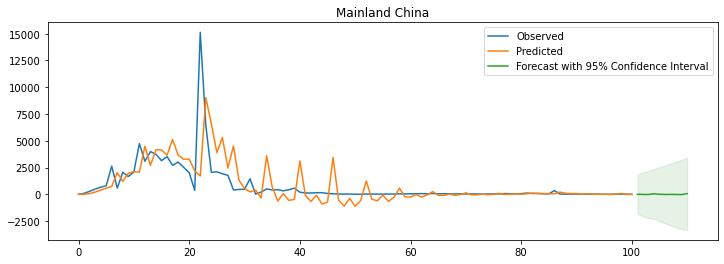

Japan: The smallest AIC is 954.5552198987971 for model SARIMAX(3, 1, 1) x (3, 1, 1, 6)
The Normalised Root Mean Squared Error of the model for Japan is 0.5288190295547394


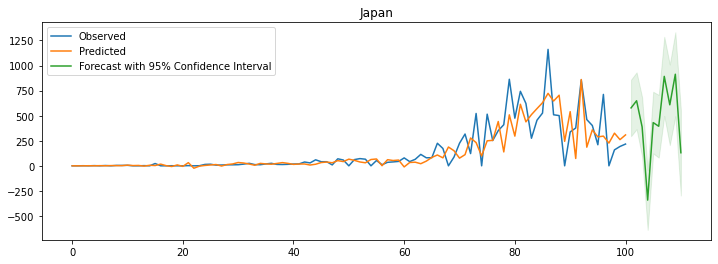

Italy: The smallest AIC is 1054.9885982750889 for model SARIMAX(3, 1, 0) x (3, 1, 1, 6)
The Normalised Root Mean Squared Error of the model for Italy is 0.33125246629990923


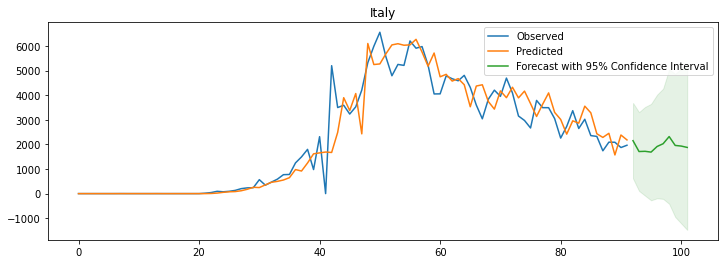

Germany: The smallest AIC is 1110.8565414670052 for model SARIMAX(3, 1, 0) x (3, 1, 1, 6)
The Normalised Root Mean Squared Error of the model for Germany is 0.3447432239852296


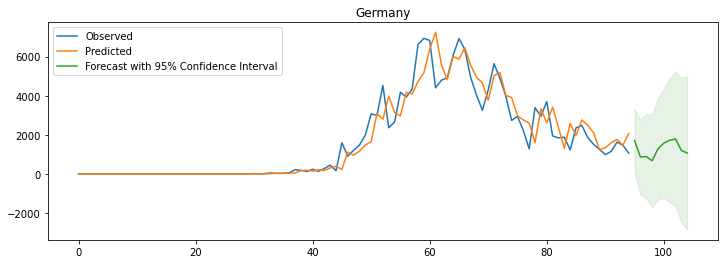

US: The smallest AIC is 1351.4395515410224 for model SARIMAX(3, 1, 0) x (3, 1, 1, 6)
The Normalised Root Mean Squared Error of the model for US is 0.14056047757892506


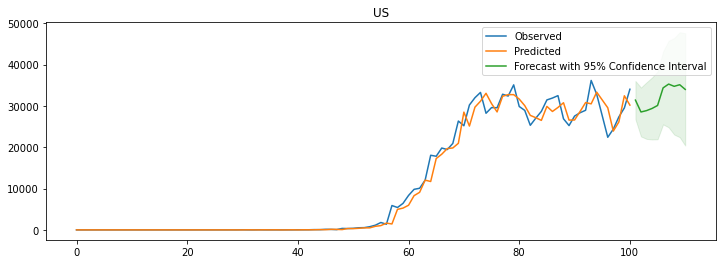

UK: The smallest AIC is 1061.3709443087728 for model SARIMAX(3, 1, 0) x (3, 1, 1, 6)
The Normalised Root Mean Squared Error of the model for UK is 0.29981026761680785


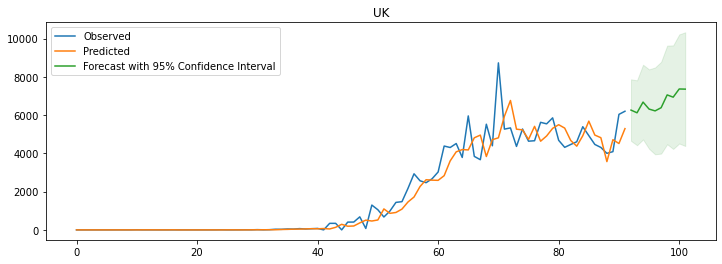

In [76]:
for country in subset:
    inc = get_inc_data(country)
    pred, fore, fore_ci = fit_model(country)
    
    # nrmse
    nrmse = get_nrmse(inc, pred.predicted_mean)
    print('The Normalised Root Mean Squared Error of the model for {} is {}'.format(country, nrmse))
    
    plot_sarimax(country, inc, pred, fore, fore_ci)

### 5.2 Logistic Growth Model

It can be inferred from the previous analysis that the spread of COVID-19 can be modelled with logistic curve, as is the case with other infectious diaeases. The growth starts exponentially, but slows down after the inflection point, essentially the midpoint of the spread, as is shown in the figure below (source: https://www.chegg.com/homework-help/inflection-point-logistic-function-important-feature-graph-l-chapter-4.7-problem-37es-solution-9781285965888-exc).
![logistic curve](log_curve.png)
A logistic curve is formed by $$f(x) = \frac{N}{1 + e^{-k(x - x_0)}},$$ where $N$ is maximum curve value. Therefore, it is feasible to estimate the final size of the epidemic.

The `curve_fit` module in SciPy supports non-linear least squares to fit a function to data.

In [77]:
# define the logistic function
def logistic_func(x, k, x0, n):
    return n / (1 + np.exp(-k*(x-x0)))

In [78]:
def fit_curve(country):
    df = df_ctrs[df_ctrs['Country']==country]
    x = range(len(df))
    y = df['Confirmed']
    
    # curve fitting
    popt, pcov = curve_fit(logistic_func, x, y, bounds=([0, 0, 0], np.inf), maxfev=10000)
    # get the optimal values for parameters
    k, x0, n = popt
    
    print('The estinamted maximum of confirmed cases in {} is {}.'.format(country, int(n)))
    
    x_fit = range(len(df)+30)
    y_fit = logistic_func(x_fit, k, x0, n)
    return x_fit, y_fit, x, y

In the figure below, predicted evaluations of confirmed cases for six countries are shown. We can see that there is a fine agreement between the fitted curve and actual data for China and Japan. Opposingly, the model obviously underestimates the final sizes of COVID-19 in the other countries. It suggests that the logistic model can make a better estimation if the statistics has passed its inflection point.

The estinamted maximum of confirmed cases in Mainland China is 81600.
The estinamted maximum of confirmed cases in Japan is 16849.
The estinamted maximum of confirmed cases in Italy is 204043.
The estinamted maximum of confirmed cases in Germany is 159404.
The estinamted maximum of confirmed cases in US is 1154095.
The estinamted maximum of confirmed cases in UK is 189793.


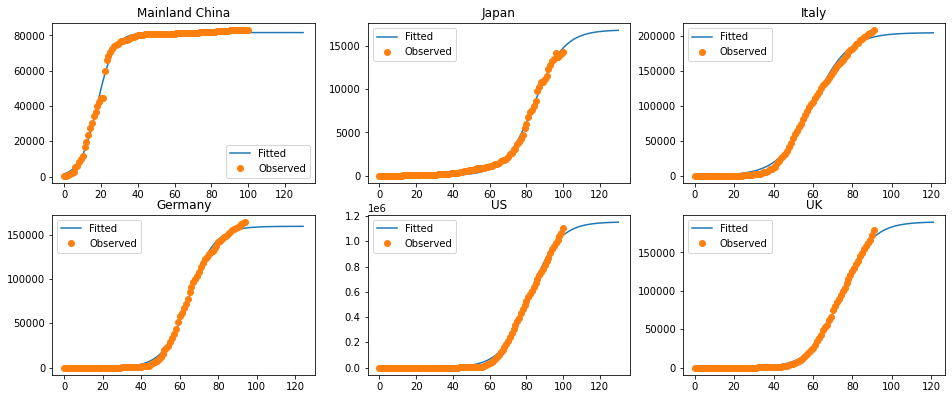

In [79]:
fig = plt.figure(figsize=(16, 10))

for country in subset:
    x_fit, y_fit, x, y = fit_curve(country)
    ax = fig.add_subplot(3, 3, subset.index(country)+1)
    ax.plot(x_fit, y_fit, label='Fitted')
    ax.plot(x, y, 'o', label='Observed')
    ax.title.set_text(country)
    ax.legend()
    
plt.show()

## 6. Conclusion

In this report, we first generate a series of interactive plots to visualise the spatial and temporal dynamics of COVID-19. Then we propose a quantitative approach to compare the current epidemic situations among countries and US states based on clustering analysis. Finally, we use ARIMA model to perform short-term forecasting and logistive function to fit the epidemic trend. The analysis above help us gain some interesting insights into the ongoing pandemic, but we need to keep in mind that numbers don't always give the whole picture.

Future work can include exploring how various demographics, e.g. population, genders, ethics, etc., affect the spread of COVID-19 and the mortality in different countries. In turn, we can also study how the pandemic influences the economy, environment, and so forth globally and regionally.

Last but not least, stay home, keep social distancing and help flatten the curve.

### References

YANG, Z., ZENG, Z., WANG, K., WONG, S.-S., LIANG, W., ZANIN, M., LIU, P., CAO, X., GAO, Z., MAI, Z., LIANG, J., LIU, X., LI, S., LI, Y., YE, F., GUAN, W., YANG, Y., LI, F., LUO, S., XIE, Y., LIU, B., WANG, Z., ZHANG, S., WANG, Y., ZHONG, N. & HE, J. 2020. Modified SEIR and AI prediction of the epidemics trend of COVID-19 in China under public health interventions. Journal of Thoracic Disease, 12, 165-174.